# Description:
- "In this project, we classify images into six categories (buildings, forest, glacier, mountain, sea, and street) using a Convolutional Neural Network (CNN). The model is trained on the Intel Image Classification dataset. We utilize Python libraries such as Keras and TensorFlow to design and implement the model, achieving significant accuracy in image classification."

# Sections:
- Data Preparation: Loading and preprocessing the dataset.
- Model Building: Constructing a multi-layer CNN model.
- Evaluation: Assessing model performance and visualizing results.

# 1.Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras
import warnings
warnings.filterwarnings("ignore")





# 2. Setting Data Paths

In [2]:
train_path = '../input/intel-image-classification/seg_train/'
test_path = '../input/intel-image-classification/seg_test/'
pred_path = '../input/intel-image-classification/seg_pred/'

# 3. Data Inspection

- Counting Images

In [3]:
for folder in os.listdir(os.path.join(train_path, 'seg_train')):
    folder_path = os.path.join(train_path, 'seg_train', folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    print(f'For training data, found {len(files)} files in folder "{folder}"')

For training data, found 2512 files in folder "mountain"
For training data, found 2382 files in folder "street"
For training data, found 2191 files in folder "buildings"
For training data, found 2274 files in folder "sea"
For training data, found 2271 files in folder "forest"
For training data, found 2404 files in folder "glacier"


In [4]:
for folder in os.listdir(os.path.join(test_path, 'seg_test')):
    folder_path = os.path.join(test_path, 'seg_test', folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    print(f'For testdata, found {len(files)} files in folder "{folder}"')

For testdata, found 525 files in folder "mountain"
For testdata, found 501 files in folder "street"
For testdata, found 437 files in folder "buildings"
For testdata, found 510 files in folder "sea"
For testdata, found 474 files in folder "forest"
For testdata, found 553 files in folder "glacier"


In [5]:
files = gb.glob(os.path.join(pred_path, 'seg_pred', '*.jpg'))
print(f'Found {len(files)} files ')


Found 7301 files 


- Checking Image Dimensions

In [6]:
size=[]
for folder in os.listdir(os.path.join(train_path, 'seg_train')):
    folder_path = os.path.join(train_path, 'seg_train', folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    for file in files:
        image=plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    13986
(113, 150, 3)        7
(135, 150, 3)        3
(111, 150, 3)        3
(144, 150, 3)        2
(143, 150, 3)        2
(123, 150, 3)        2
(142, 150, 3)        2
(108, 150, 3)        2
(136, 150, 3)        2
(134, 150, 3)        2
(146, 150, 3)        2
(100, 150, 3)        1
(141, 150, 3)        1
(103, 150, 3)        1
(145, 150, 3)        1
(147, 150, 3)        1
(131, 150, 3)        1
(81, 150, 3)         1
(140, 150, 3)        1
(133, 150, 3)        1
(115, 150, 3)        1
(124, 150, 3)        1
(149, 150, 3)        1
(110, 150, 3)        1
(105, 150, 3)        1
(97, 150, 3)         1
(120, 150, 3)        1
(76, 150, 3)         1
(119, 150, 3)        1
(102, 150, 3)        1
Name: count, dtype: int64

In [7]:
size=[]
for folder in os.listdir(os.path.join(test_path, 'seg_test')):
    folder_path = os.path.join(test_path, 'seg_test', folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    for file in files:
        image=plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    2993
(81, 150, 3)        1
(131, 150, 3)       1
(141, 150, 3)       1
(149, 150, 3)       1
(110, 150, 3)       1
(76, 150, 3)        1
(72, 150, 3)        1
Name: count, dtype: int64

In [8]:
size=[]
files = gb.glob(os.path.join(pred_path, 'seg_pred', '*.jpg'))
for file in files:
        image=plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(139, 150, 3)       1
(108, 150, 3)       1
(129, 150, 3)       1
(143, 150, 3)       1
(149, 150, 3)       1
(144, 150, 3)       1
(133, 150, 3)       1
(112, 150, 3)       1
(100, 150, 3)       1
(374, 500, 3)       1
(126, 150, 3)       1
(124, 150, 3)       1
(131, 150, 3)       1
Name: count, dtype: int64

# 4. Image Preprocessing

- Standardizing Image Size

In [9]:
s=100

- Mapping Labels to Numeric Codes

In [10]:
code={'buildings':0,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}
def getcode(n):
    for x,y in code.items():
        if n==y:
            return x

# 5. Preparing the Datasets

- Training Data

In [11]:
x_train=[]
y_train=[]
for folder in os.listdir(os.path.join(train_path, 'seg_train')):
    folder_path = os.path.join(train_path, 'seg_train', folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    for file in files:
        image=cv2.imread(file)
        image_array=cv2.resize(image,(s,s))
        x_train.append(list(image_array))
        y_train.append(code[folder])



In [12]:
print(f'we have {len(x_train)} items in x_train')

we have 14034 items in x_train


- Testing Data

In [13]:
x_test=[]
y_test=[]
for folder in os.listdir(os.path.join(test_path, 'seg_test')):
    folder_path = os.path.join(test_path, 'seg_test', folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    for file in files:
        image=cv2.imread(file)
        image_array=cv2.resize(image,(s,s))
        x_test.append(list(image_array))
        y_test.append(code[folder])



In [14]:
print(f'we have {len(x_test)} items in x_test')


we have 3000 items in x_test


In [15]:
x_pred=[]
files=gb.glob(os.path.join(pred_path,'seg_pred','*.jpg'))
for file in files:
    image=cv2.imread(file)
    image_array=cv2.resize(image,(s,s))
    x_pred.append(list(image_array))
    


In [16]:
print(f'we have{len(x_pred)} items in x_pred')

we have7301 items in x_pred


# 6. Visualizing Sample Images

- Training Data Visualization

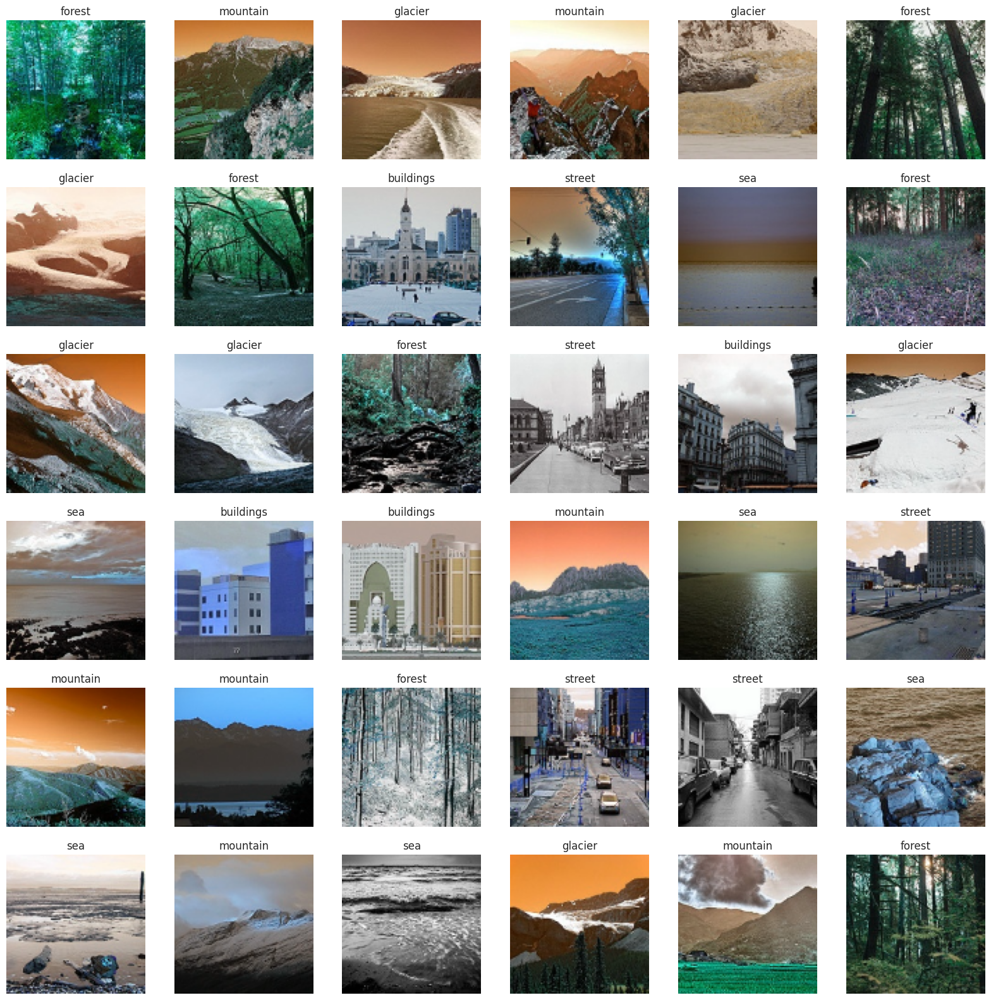

In [17]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(x_train),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_train[i])
    plt.axis('off')
    plt.title(getcode(y_train[i]))

- Test Data Visualization



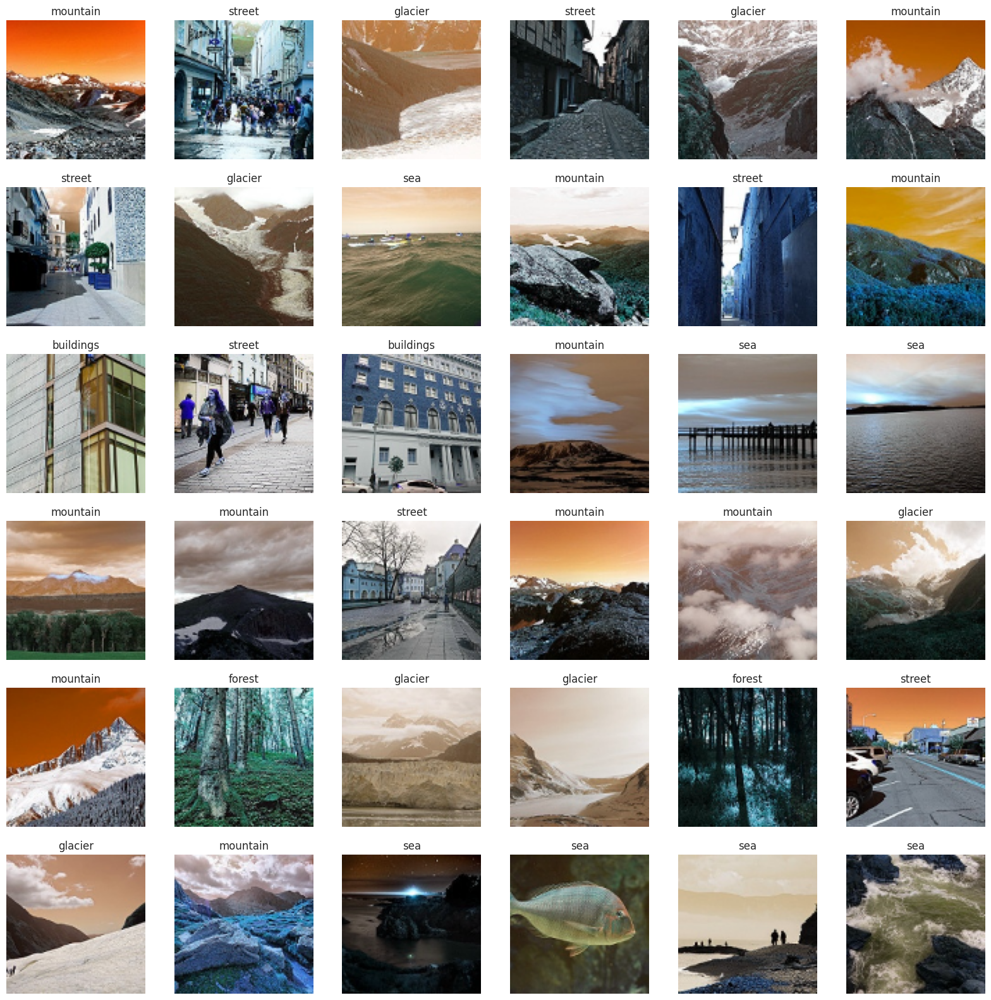

In [18]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(x_test),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_test[i])
    plt.axis('off')
    plt.title(getcode(y_test[i]))

- Prediction Data Visualization

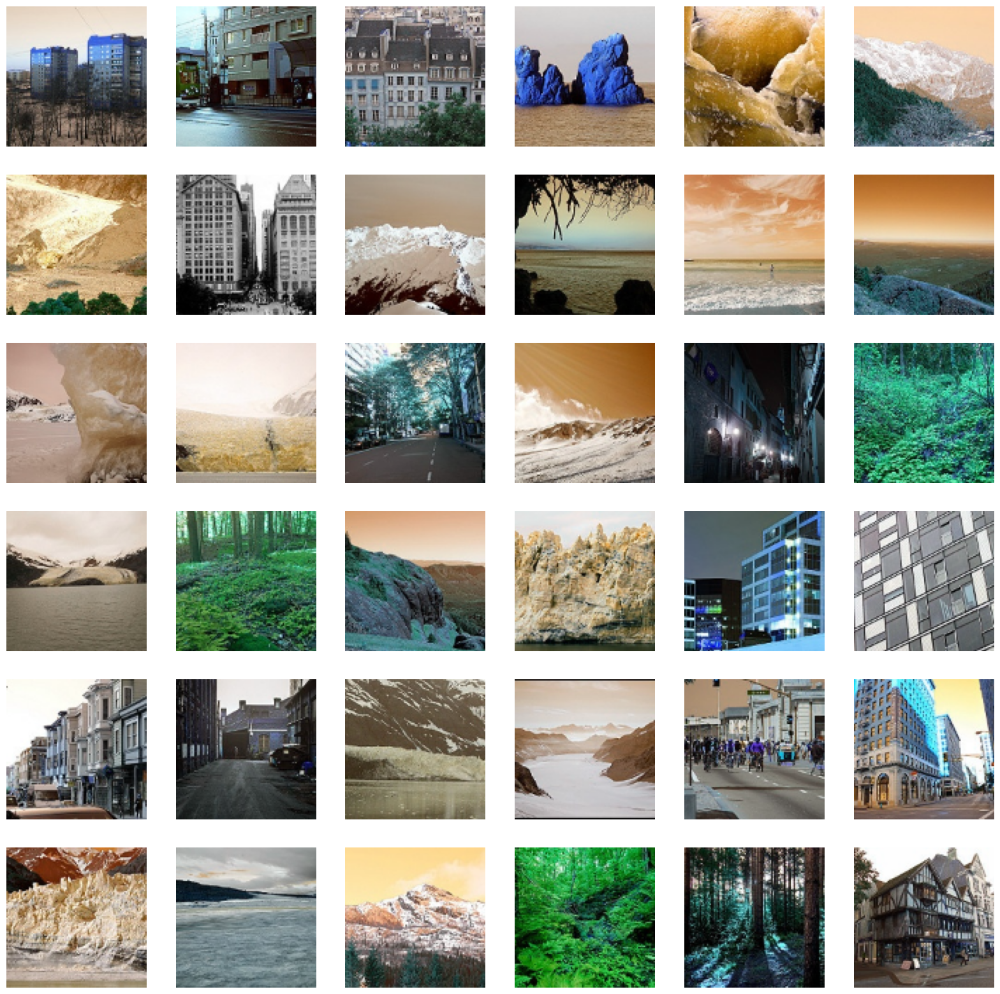

In [19]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(x_pred),36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_pred[i])
    plt.axis('off')

convert data from lists to arrays

# 7. Converting Data to Arrays

In [20]:
x_train=np.array(x_train)
x_test=np.array(x_test)
x_pred=np.array(x_pred)
y_train=np.array(y_train)
y_test=np.array(y_test)
print(f"x_train shape is {x_train.shape}\n"
      f"x_test shape is {x_test.shape}\n"
      f"x_pred shape is {x_pred.shape}\n"
      f"y_train shape is {y_train.shape}\n"
      f"y_test shape is {y_test.shape}")

x_train shape is (14034, 100, 100, 3)
x_test shape is (3000, 100, 100, 3)
x_pred shape is (7301, 100, 100, 3)
y_train shape is (14034,)
y_test shape is (3000,)


now build cnn model by keras

# 8. Building the CNN Model


In [21]:
KerasModel = keras.models.Sequential([
        keras.layers.Conv2D(2,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten() ,    
        keras.layers.Dense(120,activation='relu') ,    
        keras.layers.Dense(100,activation='relu') ,    
        keras.layers.Dense(50,activation='relu') ,        
        keras.layers.Dropout(rate=0.5) ,            
        keras.layers.Dense(6,activation='softmax') ,    
        ])

- Compiling the Model

In [22]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [23]:
print('Model Details are :')
print(KerasModel.summary())

Model Details are :


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 98, 98, 2)      │            56 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 96, 96, 150)    │         2,850 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 24, 24, 150)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 22, 22, 120)    │       162,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 20, 20, 80)     │        86,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 18, 18, 50)     │        36,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 4, 4, 50)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 800)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │        96,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        12,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 401,132 (1.53 MB)

 Trainable params: 401,132 (1.53 MB)

 Non-trainable params: 0 (0.00 B)

None


# 9. Training the Model

In [24]:
epochs = 50
ThisModel = KerasModel.fit(x_train, y_train, epochs=epochs,batch_size=64,verbose=1)

Epoch 1/50


I0000 00:00:1732132767.022095      68 service.cc:145] XLA service 0x79bde4031ab0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732132767.022163      68 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  7/220 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.1785 - loss: 6.6604

I0000 00:00:1732132773.220186      68 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


220/220 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step - accuracy: 0.2986 - loss: 2.0886
Epoch 2/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.5039 - loss: 1.2379
Epoch 3/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.6115 - loss: 1.0058
Epoch 4/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.6646 - loss: 0.8925
Epoch 5/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.7222 - loss: 0.7856
Epoch 6/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.7491 - loss: 0.7190
Epoch 7/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.7726 - loss: 0.6437
Epoch 8/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.7858 - loss: 0.6140
Epoch 9/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.8142 - loss: 0.5542
Epoch 10/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.8059 - loss: 0.5599
Epoch 11/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.8310 - loss: 0.4992
Epoch 12/50
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/st

# 10. Evaluating the Model

In [25]:
model_loss,model_accuracy=KerasModel.evaluate(x_test, y_test)
print('Test Loss is {}'.format(model_loss))
print('Test Accuracy is {}'.format(model_accuracy ))

94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7816 - loss: 1.9448
Test Loss is 1.6820216178894043
Test Accuracy is 0.8016666769981384


# 11. Making Predictions

- Predictions on Test Data

In [26]:
y_pred = KerasModel.predict(x_test)

print('Prediction Shape is {}'.format(y_pred.shape))

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Prediction Shape is (3000, 6)


- Predictions on New Data

In [27]:
y_result = KerasModel.predict(x_pred)

print('Prediction Shape is {}'.format(y_result.shape))

229/229 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Prediction Shape is (7301, 6)


# 12. Visualizing Predictions

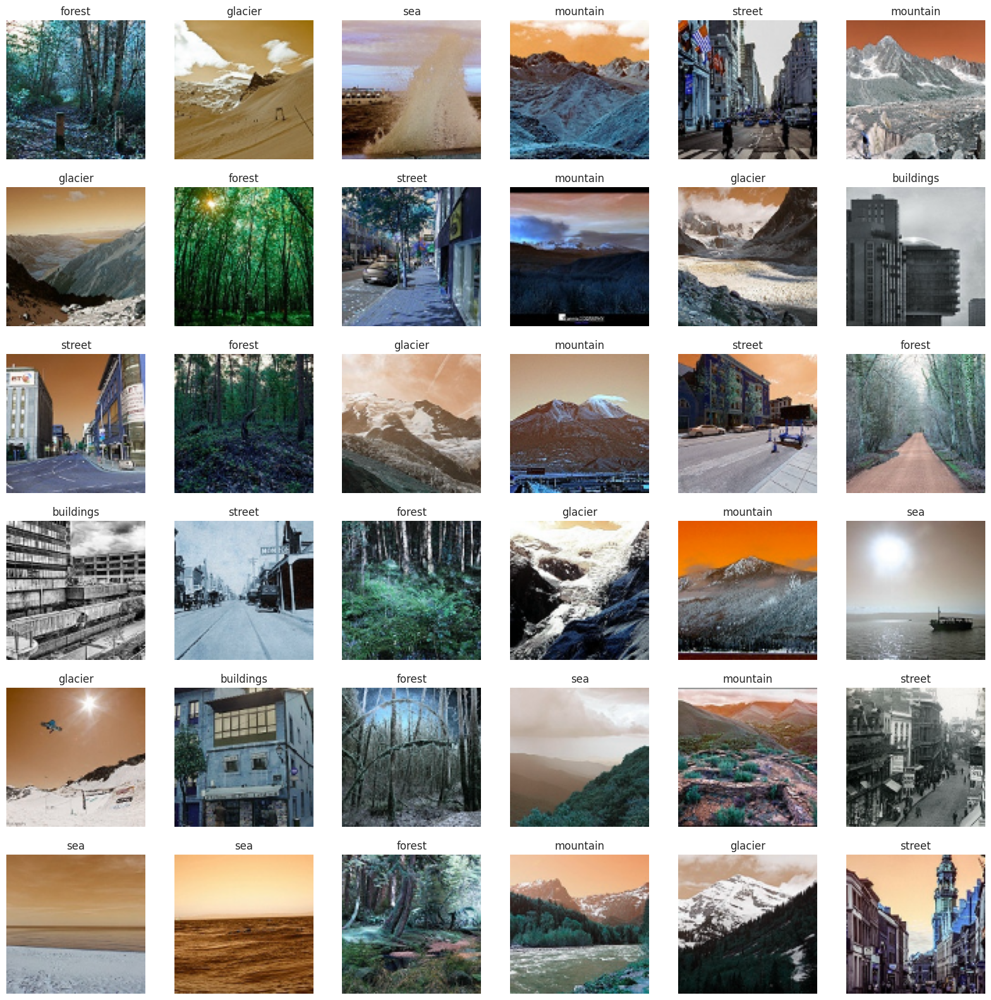

In [28]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(x_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))